In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df = pd.read_csv("owid-covid-data.csv")
df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166321,ZWE,Africa,Zimbabwe,2022-03-01,236871.0,491.0,413.000,5395.0,0.0,1.000,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166322,ZWE,Africa,Zimbabwe,2022-03-02,237503.0,632.0,416.286,5396.0,1.0,1.143,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166323,ZWE,Africa,Zimbabwe,2022-03-03,237503.0,0.0,362.286,5396.0,0.0,0.857,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
166324,ZWE,Africa,Zimbabwe,2022-03-04,238739.0,1236.0,467.429,5397.0,1.0,0.714,...,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [3]:
USA_data = df[df['location'] == 'United States']
USA_data = USA_data.set_index('date')
Brazil_data = df[df['location'] == 'Brazil']
Brazil_data = Brazil_data.set_index('date')
Germany_data = df[df['location'] == 'Germany']
Germany_data = Germany_data.set_index('date')
China_data = df[df['location'] == 'China']
China_data = China_data.set_index('date')
Nigeria_data = df[df['location'] == 'Nigeria']
Nigeria_data = Nigeria_data.set_index('date')
Australia_data = df[df['location'] == 'Australia']
Australia_data = Australia_data.set_index('date')

In [4]:
USA_train = USA_data[0:710]
USA_test = USA_data[711:800]
Brazil_train = Brazil_data[0:710]
Brazil_test = Brazil_data[711:800]
Germany_train = Germany_data[0:710]
Germany_test = Germany_data[711:800]
China_train = China_data[0:710]
China_test = China_data[711:800]
Nigeria_train = Nigeria_data[0:710]
Nigeria_test = Nigeria_data[711:800]
Australia_train = Australia_data[0:710]
Australia_test = Australia_data[711:800]

In [5]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

# Vaccinations

Many countries are missing vaccination data only within an initial time period (about a 1 year delay), but are generally complete going forward. Each of the countries will be check to verify this information, and may be chosen as predictors despite higher missingness proportions. We anticipate our models to be robust to this specific pattern of missingness.

# USA

In [6]:
missing_USA = pd.DataFrame(USA_train.isnull().sum())
missing_USA['% missing'] = USA_train.isnull().sum()/USA_train.shape[0]
missing_USA.columns = ["Missing Count", "Proportion Missing"]
missing_USA = missing_USA.sort_values(by="Proportion Missing", ascending=True)
missing_USA = missing_USA[missing_USA["Proportion Missing"] < .50]
print(missing_USA.shape)
missing_USA

(57, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [7]:
# Selecting predictors with adequate missingness

selected_USA = missing_USA.index
USA_train = USA_train[selected_USA] 
USA_test = USA_test[selected_USA] 

# Brazil

In [8]:
missing_Brazil = pd.DataFrame(Brazil_train.isnull().sum())
missing_Brazil['% missing'] = Brazil_train.isnull().sum()/Brazil_train.shape[0]
missing_Brazil.columns = ["Missing Count", "Proportion Missing"]
missing_Brazil = missing_Brazil.sort_values(by="Proportion Missing", ascending=True)
missing_Brazil = missing_Brazil[missing_Brazil["Proportion Missing"] < .50]
print(missing_Brazil.shape)
missing_Brazil

(47, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [9]:
# Selecting predictors with adequate missingness

selected_Brazil = missing_Brazil.index[:-2]
Brazil_train = Brazil_train[selected_Brazil] 
Brazil_test = Brazil_test[selected_Brazil] 

# Germany

In [10]:
missing_Germany = pd.DataFrame(Germany_train.isnull().sum())
missing_Germany['% missing'] = Germany_train.isnull().sum()/Germany_train.shape[0]
missing_Germany.columns = ["Missing Count", "Proportion Missing"]
missing_Germany = missing_Germany.sort_values(by="Proportion Missing", ascending=True)
missing_Germany = missing_Germany[missing_Germany["Proportion Missing"] < .50]
print(missing_Germany.shape)
missing_Germany

(50, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000
male_smokers,0,0.000000


In [11]:
# Selecting predictors with adequate missingness

selected_Germany = missing_Germany.index
Germany_train = Germany_train[selected_Germany] 
Germany_test = Germany_test[selected_Germany] 

# China

In [12]:
missing_China = pd.DataFrame(China_train.isnull().sum())
missing_China['% missing'] = China_train.isnull().sum()/China_train.shape[0]
missing_China.columns = ["Missing Count", "Proportion Missing"]
missing_China = missing_China.sort_values(by="Proportion Missing", ascending=True)
missing_China = missing_China[missing_China["Proportion Missing"] < .70]
print(missing_China.shape)
missing_China

(36, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
stringency_index,0,0.000000
population,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000


In [13]:
# Selecting predictors with adequate missingness


selected_China = missing_China.index
China_train = China_train[selected_China] 
China_test = China_test[selected_China] 

# Nigeria

In [14]:
missing_Nigeria = pd.DataFrame(Nigeria_train.isnull().sum())
missing_Nigeria['% missing'] = Nigeria_train.isnull().sum()/Nigeria_train.shape[0]
missing_Nigeria.columns = ["Missing Count", "Proportion Missing"]
missing_Nigeria = missing_Nigeria.sort_values(by="Proportion Missing", ascending=True)
missing_Nigeria = missing_Nigeria[missing_Nigeria["Proportion Missing"] < .60]
print(missing_Nigeria.shape)
missing_Nigeria

(39, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000
male_smokers,0,0.000000


In [15]:
# Selecting predictors with adequate missingness

selected_Nigeria = missing_Nigeria.index
Nigeria_train = Nigeria_train[selected_Nigeria] 
Nigeria_test = Nigeria_test[selected_Nigeria] 

# Australia

In [16]:
missing_Australia = pd.DataFrame(Australia_train.isnull().sum())
missing_Australia['% missing'] = Australia_train.isnull().sum()/Australia_train.shape[0]
missing_Australia.columns = ["Missing Count", "Proportion Missing"]
missing_Australia = missing_Australia.sort_values(by="Proportion Missing", ascending=True)
missing_Australia = missing_Australia[missing_Australia["Proportion Missing"] < .60]
print(missing_Australia.shape)
missing_Australia

(55, 2)


,Missing Count,Proportion Missing
iso_code,0,0.000000
population_density,0,0.000000
median_age,0,0.000000
aged_65_older,0,0.000000
aged_70_older,0,0.000000
gdp_per_capita,0,0.000000
extreme_poverty,0,0.000000
cardiovasc_death_rate,0,0.000000
diabetes_prevalence,0,0.000000
female_smokers,0,0.000000


In [17]:
# Selecting predictors with adequate missingness

selected_Australia = missing_Australia.index
Australia_train = Australia_train[selected_Australia] 
Australia_test = Australia_test[selected_Australia] 

# Notes, Selection Justification

* Though we are checking predictor missingness off of the training data set, we are looking at the actual data spread from the entire CSV file in excel. This way, we can check the date ranges the missingness falls within, if there is a pattern.

* Final predictor count for each country is 1 less than listed from the missingness data frames generated, because we are exclusing iso_code as a predictor.


1. USA_train has 45 predictors below 30% missingness. The next 11 predictors had missingness between 45-46%. However, these predictors displayed missingness only up until middle of December 2020, so they are kept. Thus, 56 predictors are kept for USA, demonstrating up to 46% missingness. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 25%. (56)

2. Brazil_train only has 33 predictors below 30% missingness. The next 13 predictors had missingness between 46-49%. However, 11 of these predictors displayed missingness only up until early February of 2021, so they are kept. The other two predictors (total_tests and total_tests_per_thousand) had sporadic missingness all across the timeline, so they were removed. Thus, 44 predictors are kept for Brazil, demonstrating upto 47.3% missingness. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 9.4%. (44)

3. Germany_train has only 36 predictors below 30% missingness. The next 13 predictors had missingness around 47%. However, these predictors only displayed missingess up until the end of December 2020, so they are kept. Thus, 49 predictors are kept for Germany, demonstrating missingness up to 47%. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 10%. (49)

4. China_train only has 30 predictors below 30% missingness. The next 2 are new_vaccinations_smoothed and new_vaccinations_smoothed_per_million, which had missingness around 46%. However, these two only displayed missingness up until the middle of December 2020, so they are kept. Though the the other vaccination based predictors had missingness about 50%, they are kept because they stay below 60%. Thus, a total of 35 predictors are selected. (35)

5. Nigeria_train has only 34 predictors below 30% missingness. Though the next 4 predictors following these display missingness above 50%, so they fall below 60%, so they are kept. Thus, we will select a total of 38 predictors. (38)

6. Australia_train has 43 predictors below 30% missingness. Even though the following 11 predictors are above 50% missingness, they are below 60%, so threy are kept. Thus, we will select a total of 54 predictors. (54)

# Addressing Missingness and Imputing values

After evaluating the definitions of all the variables, our group decided to drop the three following variables despite their proportion of missing values being 0%: diabetes_prevalance, female_smokers, male_smokers. The reasoning behind is that none of three variables have much of an intuitive relationship or correlation with the response variable new_cases. Additionally, all the values for a column are the same in every row, which will coontribute less meaningful data into our analysis and eventual model-buildings process. Therefore, we have dropped these three columns from all six countries.

In [18]:
USA_train = USA_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
USA_test = USA_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

Brazil_train = Brazil_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
Brazil_test = Brazil_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

Germany_train = Germany_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
Germany_test = Germany_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

China_train = China_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
China_test = China_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

Nigeria_train = Nigeria_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
Nigeria_test = Nigeria_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

Australia_train = Australia_train.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)
Australia_test = Australia_test.drop(columns = ['diabetes_prevalence', 'female_smokers', 'male_smokers'], axis=1)

# After dropping by contextual intuition and reasoning

1. USA_train now has 42 predictors below 30% missingness. The next 11 predictors had missingness between 45-46%. However, these predictors displayed missingness only up until middle of December 2020, so they are kept. Thus, 56 predictors are kept for USA, demonstrating up to 46% missingness. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 25%. (53)

2. Brazil_train now has 30 predictors below 30% missingness. The next 13 predictors had missingness between 46-49%. However, 11 of these predictors displayed missingness only up until early February of 2021, so they are kept. The other two predictors (total_tests and total_tests_per_thousand) had sporadic missingness all across the timeline, so they were removed. Thus, 44 predictors are kept for Brazil, demonstrating upto 47.3% missingness. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 9.4%. (41)

3. Germany_train now has 33 predictors below 30% missingness. The next 13 predictors had missingness around 47%. However, these predictors only displayed missingess up until the end of December 2020, so they are kept. Thus, 49 predictors are kept for Germany, demonstrating missingness up to 47%. There is a large gap between the additional set of predictors and the original set, whose highest missingness was around 10%. (46)

4. China_train now has 27 predictors below 30% missingness. The next 2 are new_vaccinations_smoothed and new_vaccinations_smoothed_per_million, which had missingness around 46%. However, these two only displayed missingness up until the middle of December 2020, so they are kept. Though the the other vaccination based predictors had missingness about 50%, they are kept because they stay below 60%. Thus, a total of 35 predictors are selected. (32)

5. Nigeria_train now has 31 predictors below 30% missingness. Though the next 4 predictors following these display missingness above 50%, so they fall below 60%, so they are kept. Thus, we will select a total of 35 predictors. (35)

6. Australia_train now has 40 predictors below 30% missingness. Even though the following 11 predictors are above 50% missingness, they are below 60%, so threy are kept. Thus, we will select a total of 51 predictors. (51)

# Imputing missing values
There are two approaches we will follow when imputing for missing data. The first is manually setting the missing values for any vaccination, death or case-related variables to 0 for all entries in the early dates of 2020 from the train data. The reasoning behind this is because many of the variables with missing values for these entries simply were not created until later in 2020. For example, new_cases and new_cases_smoothed could only be attained as testing for Covid became more accessible and a widespread practice. Setting these values to 0 is most appropritate for the misisng values in 2020. Any other misisng values for these variables were filled using forward fill. The second approach involves filling the missing values for any other predictor variables not previously described using backward fill. The reasoning and justification for this is that reproduction_rate and icu_pateints might not have been known at the time, but these values were not 0. Therefore, using backward will is most appropriate because we fill all the values of early 2020 with the first recorded entry. After 2020, we also used forward fill to impute any remaining data. In the event where data was missing throughout/randomly over time but not from the very beginning of a country's dataset, we used ffill to impute the missing values.

## United States

In [19]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0 = ['new_cases_per_million', 'new_cases', 'new_cases_smoothed_per_million', 'new_cases_smoothed', 
                     'total_deaths_per_million', 'new_deaths', 'total_deaths', 'new_deaths_per_million', 'tests_units', 
                     'total_tests_per_thousand', 'new_tests', 'total_tests', 'new_tests_per_thousand', 
                     'new_deaths_smoothed', 'new_deaths_smoothed_per_million', 'positive_rate', 'tests_per_case', 
                     'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'total_vaccinations_per_hundred', 
                     'people_vaccinated', 'people_fully_vaccinated', 'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 
                     'total_vaccinations', 'new_vaccinations', 'new_vaccinations_smoothed', 'new_people_vaccinated_smoothed_per_hundred', 
                     'new_people_vaccinated_smoothed', 'new_vaccinations_smoothed_per_million']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 
                     'hosp_patients_per_million', 'weekly_hosp_admissions_per_million', 'weekly_hosp_admissions']             

# Applying zero-fill for the first 340 rows (all the rows of 2020 train data) for columns_to_fill_0
USA_train[columns_to_fill_0] = USA_train[columns_to_fill_0].fillna(0, limit=340)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
USA_train[columns_to_fill_0] = USA_train[columns_to_fill_0].fillna(method='ffill')

# Applying backward fill for the first 340 rows (all the rows of 2020 train data) for columns_to_bfill
USA_train[columns_to_bfill] = USA_train[columns_to_bfill].fillna(method='bfill', limit=340)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
USA_train[columns_to_bfill] = USA_train[columns_to_bfill].fillna(method='ffill')

In [20]:
# Check if there are any missing values in the entire DataFrame
any_missing = USA_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the United States DataFrame?", any_missing)

Are there any missing values in the United States DataFrame? False


## Brazil

In [21]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0 = ['new_deaths_per_million', 'total_deaths_per_million', 'new_cases_smoothed_per_million', 'new_deaths', 
                     'total_deaths', 'new_cases_smoothed', 'new_deaths_smoothed', 'new_deaths_smoothed_per_million', 
                     'tests_units', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'new_vaccinations_smoothed',
                     'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 'new_people_vaccinated_smoothed_per_hundred',
                     'total_vaccinations', 'total_vaccinations_per_hundred', 'new_vaccinations', 'people_vaccinated', 
                     'people_vaccinated_per_hundred', 'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate']
    
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_ffill = ['new_cases_per_million', 'new_cases']

# Applying zero-fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0
Brazil_train[columns_to_fill_0] = Brazil_train[columns_to_fill_0].fillna(0, limit=100)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Brazil_train[columns_to_fill_0] = Brazil_train[columns_to_fill_0].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
Brazil_train[columns_to_bfill] = Brazil_train[columns_to_bfill].fillna(method='bfill', limit=100)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Brazil_train[columns_to_bfill] = Brazil_train[columns_to_bfill].fillna(method='ffill')

# Applying forward fill for new_cases_per_million and new_cases
Brazil_train[columns_to_ffill] = Brazil_train[columns_to_ffill].fillna(method='ffill')

In [22]:
# Check if there are any missing values in the entire DataFrame
any_missing = Brazil_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Brazil DataFrame?", any_missing)

Are there any missing values in the Brazil DataFrame? False


## Germany

In [23]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0 = ['total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'total_vaccinations_per_hundred',
                    'people_vaccinated_per_hundred', 'people_fully_vaccinated_per_hundred', 'new_people_vaccinated_smoothed_per_hundred',
                    'new_vaccinations_smoothed_per_million', 'new_vaccinations_smoothed', 'new_vaccinations', 'new_people_vaccinated_smoothed',
                    'total_boosters_per_hundred', 'total_boosters', 'new_cases_smoothed', 'new_cases_smoothed_per_million', 
                    'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million', 'total_deaths', 'total_deaths_per_million', 
                    'new_deaths', 'new_deaths_per_million', 'tests_units', 'new_tests_smoothed', 
                    'new_tests_smoothed_per_thousand', 'new_deaths_smoothed_per_million', 'new_deaths_smoothed']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million',
                    'weekly_hosp_admissions_per_million', 'weekly_hosp_admissions']             

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_ffill = ['new_cases_per_million', 'new_cases']


# Applying zero-fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0
Germany_train[columns_to_fill_0] = Germany_train[columns_to_fill_0].fillna(0, limit=100)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Germany_train[columns_to_fill_0] = Germany_train[columns_to_fill_0].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
Germany_train[columns_to_bfill] = Germany_train[columns_to_bfill].fillna(method='bfill', limit=100)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Germany_train[columns_to_bfill] = Germany_train[columns_to_bfill].fillna(method='ffill')

# Applying forward fill for new_cases_per_million and new_cases
Germany_train[columns_to_ffill] = Germany_train[columns_to_ffill].fillna(method='ffill')

In [24]:
# Check if there are any missing values in the entire DataFrame
any_missing = Germany_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Germany DataFrame?", any_missing)

Are there any missing values in the Germany DataFrame? False


## China

In [25]:
# variables that have missing values for first part of 2020 (until June) -- filling missing values in 2020 with 0 
columns_to_fill_0_p1 = ['new_deaths_per_million', 'new_deaths', 'new_cases_per_million', 'new_cases', 
                     'new_deaths_smoothed_per_million', 'new_deaths_smoothed', 'new_cases_smoothed',
                     'new_cases_smoothed_per_million']

# variables that have missing values for most part of 2020 -- filling missing values in 2020 with 0 
columns_to_fill_0_p2 = ['new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_vaccinations']

# variables that have missing values for most part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p3 = ['total_vaccinations']

# variables that have missing values for most part of 2020 -- filling missing values in 2020 with 0 
columns_to_fill_0_p4 = ['total_vaccinations_per_hundred']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate']             

# Applying zero-fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p1
China_train[columns_to_fill_0_p1] = China_train[columns_to_fill_0_p1].fillna(0, limit=100)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train[columns_to_fill_0_p1] = China_train[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 440 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p2
China_train[columns_to_fill_0_p2] = China_train[columns_to_fill_0_p2].fillna(0, limit=440)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train[columns_to_fill_0_p2] = China_train[columns_to_fill_0_p2].fillna(method='ffill')

# Applying zero-fill for the first 329 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p3
China_train[columns_to_fill_0_p3] = China_train[columns_to_fill_0_p3].fillna(0, limit=329)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train[columns_to_fill_0_p3] = China_train[columns_to_fill_0_p3].fillna(method='ffill')

# Applying zero-fill for the first 330 rows (all the rows of early 2020 train with missing data) for columns_to_fill_0_p4
China_train[columns_to_fill_0_p4] = China_train[columns_to_fill_0_p4].fillna(0, limit=330)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0_p1
China_train[columns_to_fill_0_p4] = China_train[columns_to_fill_0_p4].fillna(method='ffill')

# Applying backward fill for the first 100 rows (all the rows of early 2020 train with missing data) for columns_to_bfill
China_train[columns_to_bfill] = China_train[columns_to_bfill].fillna(method='bfill')

In [26]:
# Check if there are any missing values in the entire DataFrame
any_missing = China_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the China DataFrame?", any_missing)

Are there any missing values in the China DataFrame? False


## Nigeria

In [27]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0 = ['new_cases_smoothed_per_million', 'new_cases_smoothed', 'total_deaths_per_million', 
                     'total_deaths', 'new_deaths', 'new_deaths_per_million', 'new_deaths_smoothed',
                     'new_deaths_smoothed_per_million', 'tests_units', 'tests_per_case', 'positive_rate', 
                     'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'new_vaccinations_smoothed', 
                     'new_people_vaccinated_smoothed_per_hundred', 'new_people_vaccinated_smoothed', 
                     'new_vaccinations_smoothed_per_million'] 

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate']             

# Applying zero-fill for the first 340 rows (all the rows of 2020 train data) for columns_to_fill_0
Nigeria_train[columns_to_fill_0] = Nigeria_train[columns_to_fill_0].fillna(0, limit=380)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Nigeria_train[columns_to_fill_0] = Nigeria_train[columns_to_fill_0].fillna(method='ffill')

# Applying backward fill for the first 340 rows (all the rows of 2020 train data) for columns_to_bfill
Nigeria_train[columns_to_bfill] = Nigeria_train[columns_to_bfill].fillna(method='bfill')

In [28]:
# Check if there are any missing values in the entire DataFrame
any_missing = Nigeria_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Nigeria DataFrame?", any_missing)

Are there any missing values in the Nigeria DataFrame? False


## Australia

In [29]:
# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p1 = ['new_cases_smoothed_per_million', 'new_cases_smoothed', 'total_deaths_per_million', 'total_deaths',
                        'new_deaths', 'new_deaths_per_million', 'tests_units', 'total_tests_per_thousand', 'total_tests',
                        'new_tests', 'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 
                        'positive_rate', 'tests_per_case', 'new_deaths_smoothed_per_million', 'new_deaths_smoothed']                 

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with 0
columns_to_fill_0_p2 = ['new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'new_people_vaccinated_smoothed', 
                        'new_people_vaccinated_smoothed_per_hundred', 'total_vaccinations', 'people_vaccinated', 
                        'people_vaccinated_per_hundred', 'total_vaccinations_per_hundred', 'people_fully_vaccinated',
                        'people_fully_vaccinated_per_hundred', 'new_vaccinations']

# variables that have missing values for first part of 2020 -- filling missing values in 2020 with forward bfill
columns_to_bfill = ['reproduction_rate', 'icu_patients', 'icu_patients_per_million', 'hosp_patients', 
                     'hosp_patients_per_million']             

# Applying zero-fill for the first 50 rows (all the rows of 2020 train data) for columns_to_fill_0
Australia_train[columns_to_fill_0_p1] = Australia_train[columns_to_fill_0_p1].fillna(0, limit=50)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Australia_train[columns_to_fill_0_p1] = Australia_train[columns_to_fill_0_p1].fillna(method='ffill')

# Applying zero-fill for the first 400 rows (all the rows of 2020 train data) for columns_to_fill_0
Australia_train[columns_to_fill_0_p2] = Australia_train[columns_to_fill_0_p2].fillna(0, limit=400)

# Applying forward fill for remaining rows (dates after 2020) for columns_to_fill_0
Australia_train[columns_to_fill_0_p2] = Australia_train[columns_to_fill_0_p2].fillna(method='ffill')

# Applying backward fill for the first 70 rows (all the rows of 2020 train data) for columns_to_bfill
Australia_train[columns_to_bfill] = Australia_train[columns_to_bfill].fillna(method='bfill', limit=70)

# Applying forward fill for the remaining rows (dates after 2020) for columns_to_bfill
Australia_train[columns_to_bfill] = Australia_train[columns_to_bfill].fillna(method='ffill')

In [30]:
# Check if there are any missing values in the entire DataFrame
any_missing = Australia_train.isna().any().any()  # or df.isnull().any().any()

# Print the result
print("Are there any missing values in the Australia DataFrame?", any_missing)

Are there any missing values in the Australia DataFrame? False


In [31]:
USA_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,...,people_vaccinated,people_fully_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_vaccinations,new_vaccinations,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million
date,,,,,,,,,,,,,,,,,,,,,
2020-01-22,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0
2020-01-23,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0
2020-01-24,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0
2020-01-25,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0
2020-01-26,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,242268651.0,206735879.0,72.97,62.27,510632649.0,1501550.0,1080657.0,0.082,273510.0,3255.0
2021-12-28,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,242702682.0,206973527.0,73.10,62.34,512293135.0,1660486.0,1040795.0,0.081,268822.0,3135.0
2021-12-29,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,...,243137810.0,207206943.0,73.23,62.41,513936601.0,1643466.0,1013772.0,0.080,267131.0,3053.0


In [32]:
Brazil_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,...,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred
date,,,,,,,,,,,,,,,,,,,,,
2020-02-26,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00
2020-02-27,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00
2020-02-28,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00
2020-02-29,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00
2020-03-01,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-31,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,5090.0,283001.0,0.132,362503209.0,169.40,1193530.0,170322125.0,79.59,149930855.0,70.06
2022-02-01,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,5234.0,293247.0,0.137,363827251.0,170.02,1324042.0,170599221.0,79.72,150040841.0,70.11
2022-02-02,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,...,5328.0,284397.0,0.133,365113872.0,170.62,1286621.0,170911850.0,79.87,150259405.0,70.22


In [33]:
Germany_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,hospital_beds_per_thousand,population,life_expectancy,...,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_people_vaccinated_smoothed_per_hundred,new_vaccinations_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations,new_people_vaccinated_smoothed,total_boosters_per_hundred,total_boosters
date,,,,,,,,,,,,,,,,,,,,,
2020-01-27,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0
2020-01-28,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0
2020-01-29,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0
2020-01-30,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0
2020-01-31,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-01-01,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,179.12,73.69,70.65,0.045,4783.0,401335.0,28420.0,37779.0,39.05,32759020.0
2022-01-02,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,179.30,73.71,70.67,0.047,4925.0,413239.0,153575.0,39191.0,39.19,32882525.0
2022-01-03,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,...,179.87,73.76,70.74,0.044,4728.0,396676.0,479761.0,37327.0,39.65,33263190.0


In [34]:
China_train

,iso_code,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,...,new_cases,new_deaths_smoothed_per_million,new_deaths_smoothed,new_cases_smoothed,new_cases_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations
date,,,,,,,,,,,,,,,,,,,,,
2020-01-22,CHN,26.39,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,0.0,0.0,0.0,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0
2020-01-23,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,92.0,0.0,0.0,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0
2020-01-24,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,277.0,0.0,0.0,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0
2020-01-25,CHN,47.69,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,483.0,0.0,0.0,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0
2020-01-26,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,663.0,0.0,0.0,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,CHN,79.17,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,361.0,0.0,0.0,145.571,0.101,12384000.0,8575.0,2.781869e+09,192.62,12339000.0
2021-12-28,CHN,79.17,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,197.0,0.0,0.0,162.571,0.113,12720000.0,8808.0,2.795716e+09,193.58,13847000.0
2021-12-29,CHN,79.17,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,...,207.0,0.0,0.0,178.000,0.123,12951286.0,8968.0,2.810118e+09,194.58,14402000.0


In [35]:
Nigeria_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,handwashing_facilities,life_expectancy,human_development_index,...,new_deaths_smoothed_per_million,tests_units,tests_per_case,positive_rate,new_tests_smoothed,new_tests_smoothed_per_thousand,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million
date,,,,,,,,,,,,,,,,,,,,,
2020-02-28,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0
2020-02-29,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0
2020-03-01,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0
2020-03-02,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0
2020-03-03,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-02,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.001,tests performed,93.5,0.0107,8708.0,0.041,194835.0,0.058,122310.0,922.0
2022-02-03,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.001,tests performed,93.7,0.0107,8730.0,0.041,198918.0,0.054,114856.0,941.0
2022-02-04,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,...,0.001,tests performed,97.6,0.0103,8752.0,0.041,203000.0,0.051,107402.0,960.0


In [36]:
Australia_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,...,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,total_vaccinations_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,new_vaccinations
date,,,,,,,,,,,,,,,,,,,,,
2020-01-26,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0
2020-01-27,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0
2020-01-28,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0
2020-01-29,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0
2020-01-30,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,2883.0,6752.0,0.026,42580539.0,20444346.0,79.28,165.12,19755837.0,76.61,0.0
2022-01-01,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,2883.0,6752.0,0.026,42580539.0,20444346.0,79.28,165.12,19755837.0,76.61,0.0
2022-01-02,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,...,3126.0,7073.0,0.027,42768270.0,20460234.0,79.34,165.84,19778026.0,76.69,187731.0


### We have tested to see if there are any missing data entries left and there aren't. Each country now can undergo further Feature Engineering. Feature Engineering Work Begins Below. Analysis done for USA dataset, then replicated for other datasets.

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


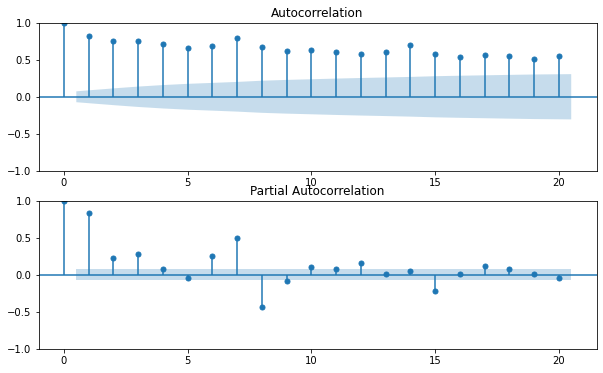

In [37]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(USA_train['new_cases'], lags=20, ax=ax1)
plot_pacf(USA_train['new_cases'], lags=20, ax=ax2)
plt.show()
# Correlation Bumps at lags of 7 and 14, so we will add lags for those values (Auto arima will do this by itself).

In [38]:
# Adding lags of 7 and 14 to USA train + test
USA_train['new_cases_Lag_7'] = USA_train['new_cases'].shift(7)
USA_train['new_cases_Lag_14'] = USA_train['new_cases'].shift(14)

USA_test['new_cases_Lag_7'] = USA_test['new_cases'].shift(7)
USA_test['new_cases_Lag_14'] = USA_test['new_cases'].shift(14)

In [39]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [40]:
# Adding Rolling statistics to USA train (14 day rolling average)
rolling_mean = USA_train['new_cases'].rolling(window=14).mean()
USA_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = USA_test['new_cases'].rolling(window=14).mean()
USA_test['Rolling_Mean_new_cases'] = rolling_mean

In [41]:
# Add Weekend/Weekday Feature
USA_train.reset_index(inplace=True)
USA_train['date'] = pd.to_datetime(USA_train['date'])
USA_train['Weekend'] = USA_train['date'].dt.dayofweek > 4 
USA_train = USA_train.set_index('date')

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,stringency_index,total_cases_per_million,human_development_index,total_cases,location,continent,population,new_cases_per_million,new_cases,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,new_deaths,total_deaths,new_deaths_per_million,tests_units,total_tests_per_thousand,new_tests,total_tests,new_tests_per_thousand,reproduction_rate,new_deaths_smoothed,new_deaths_smoothed_per_million,positive_rate,tests_per_case,new_tests_smoothed,new_tests_smoothed_per_thousand,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions_per_million,weekly_hosp_admissions,total_vaccinations_per_hundred,people_vaccinated,people_fully_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_vaccinations,new_vaccinations,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.003,0.926,1.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-23,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.003,0.926,1.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-24,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.006,0.926,2.0,United States,North America,332915074.0,0.003,1.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-25,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.006,0.926,2.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-01-26,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.009,3.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-01-27,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-28,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.015,0.926,5.0,United States,North America,332915074.0,0.000,0.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-01-29,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,0.00,0.018,0.926,6.0,United States,North America,332915074.0,0.003,1.0,0.002,0.714,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,3.62,0.000,0.000,0.000,0.0,0.0,0.000,9245.0,27.770,33759.0,101.404,91.777,30554.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.000,0.0,0.0,0.0,NaN,NaN

In [42]:
USA_test.reset_index(inplace=True)
USA_test['date'] = pd.to_datetime(USA_test['date'])
USA_test['Weekend'] = USA_test['date'].dt.dayofweek > 4 
USA_test = USA_test.set_index('date')

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,stringency_index,total_cases_per_million,human_development_index,total_cases,location,continent,population,new_cases_per_million,new_cases,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,new_deaths,total_deaths,new_deaths_per_million,tests_units,total_tests_per_thousand,new_tests,total_tests,new_tests_per_thousand,reproduction_rate,new_deaths_smoothed,new_deaths_smoothed_per_million,positive_rate,tests_per_case,new_tests_smoothed,new_tests_smoothed_per_thousand,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions_per_million,weekly_hosp_admissions,total_vaccinations_per_hundred,people_vaccinated,people_fully_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_vaccinations,new_vaccinations,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-01-02,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,166016.204,0.926,55269297.0,United States,North America,332915074.0,835.213,278055.0,1251.553,416660.857,2489.022,355.0,828633.0,1.066,tests performed,2184.460,1320765.0,727239562.0,3.967,1.64,1372.000,4.121,0.274,3.6,1876785.0,5.637,19606.0,58.892,102693.0,308.466,317.769,105790.0,155.61,243872131.0,207615104.0,73.45,62.53,516623646.0,489813.0,1070364.0,0.086,285435.0,3224.0,NaN,NaN,NaN,True
2022-01-03,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,169248.816,0.926,56345482.0,United States,North America,332915074.0,3232.611,1076185.0,1494.903,497675.714,2494.561,1844.0,830477.0,5.539,tests performed,2191.044,2192011.0,729431573.0,6.584,1.67,1365.143,4.101,0.280,3.6,1947919.0,5.851,20341.0,61.100,108779.0,326.747,335.557,111712.0,155.97,244214191.0,207808625.0,73.56,62.59,517839306.0,1215660.0,1029522.0,0.084,277934.0,3101.0,NaN,NaN,NaN,False
2022-01-04,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,171669.364,0.926,57151319.0,United States,North America,332915074.0,2420.548,805837.0,1687.590,561824.286,2501.497,2309.0,832786.0,6.936,tests performed,2199.691,2878765.0,732310338.0,8.647,1.63,1351.571,4.060,0.287,3.5,2033346.0,6.108,21040.0,63.199,114863.0,345.022,352.588,117382.0,156.39,244587667.0,208019867.0,73.67,62.65,519224451.0,1385145.0,990188.0,0.081,269284.0,2982.0,NaN,NaN,NaN,False
2022-01-05,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,173606.792,0.926,57796318.0,United States,North America,332915074.0,1937.428,644999.0,1750.046,582616.714,2507.934,2143.0,834929.0,6.437,tests performed,2209.098,3131620.0,735441958.0,9.407,1.55,1326.571,3.985,0.292,3.4,2151831.0,6.464,21532.0,64.677,121478.0,364.892,369.521,123019.0,156.81,244967821.0,208229066.0,73.78,62.72,520638353.0,1413902.0,957393.0,0.079,261430.0,2884.0,NaN,NaN,NaN,False
2022-01-06,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,176055.125,0.926,58611405.0,United States,North America,332915074.0,2448.333,815087.0,1846.877,614853.286,2513.953,2004.0,836933.0,6.020,tests performed,2218.456,3115404.0,738557362.0,9.358,1.50,1392.714,4.183,0.294,3.4,2265648.0,6.805,22134.0,66.485,126993.0,381.458,385.735,128417.0,157.24,245338595.0,208437999.0,73.90,62.78,522064304.0,1425951.0,946701.0,0.077,256938.0,2851.0,NaN,NaN,NaN,False
2022-01-07,USA,35.608,38.3,15.413,9.732,54225.446,1.2,151.089,2.77,78.86,50.46,178627.457,0.926,59467773.0,United States,North America,332915074.0,2572.332,856368.0,1998.688,665393.286,2521.051,2363.0,839296.0,7.098,tests performed,2226.987,2840121.0,741397483.0,8.531,1.46,1629.000,4.893,0.294,3.4,2387866.0,7.173,22862.0,68.672,131875.0,396.122,401.105,133534.0,157.73,2457383

In [50]:
# Checking correlation between weekend and response variable, and we can see there is some correlation
pearson_corr = USA_test['Weekend'].corr(USA_test['new_cases'], method='pearson')
print(f"Pearson correlation coefficient: {pearson_corr}")

Pearson correlation coefficient: -0.35933714376771797


In [52]:
# Now, Repeat above steps for all other countries
# Adding lags of 7 and 14 to Brazil train + test
Brazil_train['new_cases_Lag_7'] = Brazil_train['new_cases'].shift(7)
Brazil_train['new_cases_Lag_14'] = Brazil_train['new_cases'].shift(14)

Brazil_test['new_cases_Lag_7'] = Brazil_test['new_cases'].shift(7)
Brazil_test['new_cases_Lag_14'] = Brazil_test['new_cases'].shift(14)

rolling_mean = Brazil_train['new_cases'].rolling(window=14).mean()
Brazil_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Brazil_test['new_cases'].rolling(window=14).mean()
Brazil_test['Rolling_Mean_new_cases'] = rolling_mean

Brazil_train.reset_index(inplace=True)
Brazil_train['date'] = pd.to_datetime(Brazil_train['date'])
Brazil_train['Weekend'] = Brazil_train['date'].dt.dayofweek > 4 
Brazil_train = Brazil_train.set_index('date')

Brazil_test.reset_index(inplace=True)
Brazil_test['date'] = pd.to_datetime(Brazil_test['date'])
Brazil_test['Weekend'] = Brazil_test['date'].dt.dayofweek > 4 
Brazil_test = Brazil_test.set_index('date')

Brazil_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,human_development_index,population,stringency_index,total_cases_per_million,total_cases,location,continent,new_cases_per_million,new_cases,reproduction_rate,new_deaths_per_million,total_deaths_per_million,new_cases_smoothed_per_million,new_deaths,total_deaths,new_cases_smoothed,new_deaths_smoothed,new_deaths_smoothed_per_million,tests_units,new_tests_smoothed,new_tests_smoothed_per_thousand,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-26,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.005,1.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,False
2020-02-27,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,False
2020-02-28,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.005,1.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,False
2020-02-29,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.009,2.0,Brazil,South America,0.005,1.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,True
2020-03-01,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,5.56,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,True
2020-03-02,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.000,0.0,0.0,0.000,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,False
2020-03-03,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.009,2.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.001,0.0,0.0,0.286,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,NaN,NaN,NaN,False
2020-03-04,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.019,4.0,Brazil,South America,0.009,2.0,2.23,0.000,0.000,0.002,0.0,0.0,0.429,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,1.0,NaN,NaN,False
2020-03-05,BRA,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,2.2,75.88,0.765,213993441.0,11.11,0.019,4.0,Brazil,South America,0.000,0.0,2.23,0.000,0.000,0.002,0.0,0.0,0.429,0.000,0.000,0,0.0,0.000,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,NaN,NaN,False


In [53]:
# Adding lags of 7 and 14 to Germany train + test
Germany_train['new_cases_Lag_7'] = Germany_train['new_cases'].shift(7)
Germany_train['new_cases_Lag_14'] = Germany_train['new_cases'].shift(14)

Germany_test['new_cases_Lag_7'] = Germany_test['new_cases'].shift(7)
Germany_test['new_cases_Lag_14'] = Germany_test['new_cases'].shift(14)

rolling_mean = Germany_train['new_cases'].rolling(window=14).mean()
Germany_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Germany_test['new_cases'].rolling(window=14).mean()
Germany_test['Rolling_Mean_new_cases'] = rolling_mean

Germany_train.reset_index(inplace=True)
Germany_train['date'] = pd.to_datetime(Germany_train['date'])
Germany_train['Weekend'] = Germany_train['date'].dt.dayofweek > 4 
Germany_train = Germany_train.set_index('date')

Germany_test.reset_index(inplace=True)
Germany_test['date'] = pd.to_datetime(Germany_test['date'])
Germany_test['Weekend'] = Germany_test['date'].dt.dayofweek > 4 
Germany_test = Germany_test.set_index('date')

Germany_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,hospital_beds_per_thousand,population,life_expectancy,stringency_index,continent,location,total_cases_per_million,human_development_index,total_cases,new_cases_per_million,new_cases,new_cases_smoothed,new_cases_smoothed_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,reproduction_rate,total_deaths,total_deaths_per_million,new_deaths,new_deaths_per_million,tests_units,icu_patients_per_million,icu_patients,new_tests_smoothed,new_tests_smoothed_per_thousand,new_deaths_smoothed_per_million,new_deaths_smoothed,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_people_vaccinated_smoothed_per_hundred,new_vaccinations_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations,new_people_vaccinated_smoothed,total_boosters_per_hundred,total_boosters,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-27,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.012,0.947,1.0,0.012,1.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.036,3.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.000,0.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-30,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.048,0.947,4.0,0.000,0.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-31,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.060,0.947,5.0,0.012,1.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-02-01,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.095,0.947,8.0,0.036,3.0,0.000,0.000,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-02,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.119,0.947,10.0,0.024,2.0,1.429,0.017,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-03,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.143,0.947,12.0,0.024,2.0,1.571,0.019,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,1.0,NaN,NaN,False
2020-02-04,DEU,237.016,46.6,21.453,15.957,45229.245,156.139,8.0,83900471.0,81.33,5.56,Europe,Germany,0.143,0.947,12.0,0.000,0.0,1.143,0.014,0.0,0.000,2.98,0.0,0.000,0.0,0.000,0,2.384,200.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.00,0.00,0.00,0.000,0.0,0.0,0.0,0.0,0.00,0.0,3.0,NaN,NaN,False


In [54]:
# Adding lags of 7 and 14 to Nigeria train + test
Nigeria_train['new_cases_Lag_7'] = Nigeria_train['new_cases'].shift(7)
Nigeria_train['new_cases_Lag_14'] = Nigeria_train['new_cases'].shift(14)

Nigeria_test['new_cases_Lag_7'] = Nigeria_test['new_cases'].shift(7)
Nigeria_test['new_cases_Lag_14'] = Nigeria_test['new_cases'].shift(14)

rolling_mean = Nigeria_train['new_cases'].rolling(window=14).mean()
Nigeria_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Nigeria_test['new_cases'].rolling(window=14).mean()
Nigeria_test['Rolling_Mean_new_cases'] = rolling_mean

Nigeria_train.reset_index(inplace=True)
Nigeria_train['date'] = pd.to_datetime(Nigeria_train['date'])
Nigeria_train['Weekend'] = Nigeria_train['date'].dt.dayofweek > 4 
Nigeria_train = Nigeria_train.set_index('date')

Nigeria_test.reset_index(inplace=True)
Nigeria_test['date'] = pd.to_datetime(Nigeria_test['date'])
Nigeria_test['Weekend'] = Nigeria_test['date'].dt.dayofweek > 4 
Nigeria_test = Nigeria_test.set_index('date')

Nigeria_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,handwashing_facilities,life_expectancy,human_development_index,population,stringency_index,new_cases_per_million,total_cases_per_million,new_cases,total_cases,location,continent,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,total_deaths,new_deaths,new_deaths_per_million,reproduction_rate,new_deaths_smoothed,new_deaths_smoothed_per_million,tests_units,tests_per_case,positive_rate,new_tests_smoothed,new_tests_smoothed_per_thousand,new_vaccinations_smoothed,new_people_vaccinated_smoothed_per_hundred,new_people_vaccinated_smoothed,new_vaccinations_smoothed_per_million,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-28,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.005,0.005,1.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-02-29,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-03-01,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,True
2020-03-02,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-03,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-04,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-05,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.001,0.143,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,NaN,NaN,NaN,False
2020-03-06,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,1.0,NaN,NaN,False
2020-03-07,NGA,209.588,18.1,2.751,1.447,5338.454,181.013,41.949,54.69,0.539,211400704.0,11.11,0.000,0.005,0.0,1.0,Nigeria,Africa,0.000,0.000,0.000,0.0,0.0,0.000,1.29,0.000,0.000,0,0.0,0.0000,0.0,0.000,0.0,0.000,0.0,0.0,0.0,NaN,NaN,True


In [55]:
# Adding lags of 7 and 14 to China train + test
China_train['new_cases_Lag_7'] = China_train['new_cases'].shift(7)
China_train['new_cases_Lag_14'] = China_train['new_cases'].shift(14)

China_test['new_cases_Lag_7'] = China_test['new_cases'].shift(7)
China_test['new_cases_Lag_14'] = China_test['new_cases'].shift(14)

rolling_mean = China_train['new_cases'].rolling(window=14).mean()
China_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = China_test['new_cases'].rolling(window=14).mean()
China_test['Rolling_Mean_new_cases'] = rolling_mean

China_train.reset_index(inplace=True)
China_train['date'] = pd.to_datetime(China_train['date'])
China_train['Weekend'] = China_train['date'].dt.dayofweek > 4 
China_train = China_train.set_index('date')

China_test.reset_index(inplace=True)
China_test['date'] = pd.to_datetime(China_test['date'])
China_test['Weekend'] = China_test['date'].dt.dayofweek > 4 
China_test = China_test.set_index('date')

China_train

,iso_code,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,life_expectancy,human_development_index,hospital_beds_per_thousand,continent,total_deaths_per_million,location,total_cases_per_million,total_deaths,total_cases,reproduction_rate,new_deaths_per_million,new_deaths,new_cases_per_million,new_cases,new_deaths_smoothed_per_million,new_deaths_smoothed,new_cases_smoothed,new_cases_smoothed_per_million,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,total_vaccinations,total_vaccinations_per_hundred,new_vaccinations,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,CHN,26.39,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.012,China,0.379,17.0,547.0,3.04,0.000,0.0,0.000,0.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-23,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.012,China,0.442,18.0,639.0,3.04,0.001,1.0,0.064,92.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-24,CHN,44.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.018,China,0.634,26.0,916.0,3.24,0.006,8.0,0.192,277.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-25,CHN,47.69,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.029,China,0.969,42.0,1399.0,3.41,0.011,16.0,0.334,483.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,True
2020-01-26,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.039,China,1.428,56.0,2062.0,3.49,0.010,14.0,0.459,663.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,True
2020-01-27,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.057,China,1.982,82.0,2863.0,3.54,0.018,26.0,0.555,801.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.091,China,3.804,131.0,5494.0,3.55,0.034,49.0,1.822,2631.0,0.000,0.000,0.000,0.000,0.0,0.0,0.000000e+00,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.092,China,4.203,133.0,6070.0,3.21,0.001,2.0,0.399,576.0,0.011,16.571,789.000,0.546,0.0,0.0,0.000000e+00,0.00,0.0,0.0,NaN,NaN,False
2020-01-30,CHN,69.91,1.444216e+09,147.674,38.7,10.641,5.929,15308.712,0.7,261.899,76.91,0.761,4.34,Asia,0.118,China,5.625,171.0,8124.0,3.00,0.026,38.0,1.422,2054.0,0.015,21.857,1069.286,0.740,0.0,0.0,0.000000e+00,0.00,0.0,92.0,NaN,NaN,False


In [56]:
# Adding lags of 7 and 14 to Australia train + test
Australia_train['new_cases_Lag_7'] = Australia_train['new_cases'].shift(7)
Australia_train['new_cases_Lag_14'] = Australia_train['new_cases'].shift(14)

Australia_test['new_cases_Lag_7'] = Australia_test['new_cases'].shift(7)
Australia_test['new_cases_Lag_14'] = Australia_test['new_cases'].shift(14)

rolling_mean = Australia_train['new_cases'].rolling(window=14).mean()
Australia_train['Rolling_Mean_new_cases'] = rolling_mean
rolling_mean = Australia_test['new_cases'].rolling(window=14).mean()
Australia_test['Rolling_Mean_new_cases'] = rolling_mean

Australia_train.reset_index(inplace=True)
Australia_train['date'] = pd.to_datetime(Australia_train['date'])
Australia_train['Weekend'] = Australia_train['date'].dt.dayofweek > 4 
Australia_train = Australia_train.set_index('date')

Australia_test.reset_index(inplace=True)
Australia_test['date'] = pd.to_datetime(Australia_test['date'])
Australia_test['Weekend'] = Australia_test['date'].dt.dayofweek > 4 
Australia_test = Australia_test.set_index('date')

Australia_train

,iso_code,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,hospital_beds_per_thousand,life_expectancy,stringency_index,new_cases_per_million,total_cases_per_million,human_development_index,new_cases,total_cases,location,continent,population,new_cases_smoothed_per_million,new_cases_smoothed,total_deaths_per_million,total_deaths,new_deaths,new_deaths_per_million,tests_units,total_tests_per_thousand,total_tests,new_tests,new_tests_per_thousand,reproduction_rate,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,new_deaths_smoothed_per_million,new_deaths_smoothed,icu_patients_per_million,hosp_patients,hosp_patients_per_million,icu_patients,new_vaccinations_smoothed,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,total_vaccinations_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,new_vaccinations,new_cases_Lag_7,new_cases_Lag_14,Rolling_Mean_new_cases,Weekend
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-26,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.155,0.155,0.944,4.0,4.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-01-27,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.039,0.194,0.944,1.0,5.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-28,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.000,0.194,0.944,0.0,5.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-29,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.039,0.233,0.944,1.0,6.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-30,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.116,0.349,0.944,3.0,9.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-01-31,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,5.56,0.000,0.349,0.944,0.0,9.0,Australia,Oceania,25788217.0,0.000,0.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,False
2020-02-01,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,13.89,0.116,0.465,0.944,3.0,12.0,Australia,Oceania,25788217.0,0.066,1.714,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,True
2020-02-02,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,13.89,0.000,0.465,0.944,0.0,12.0,Australia,Oceania,25788217.0,0.044,1.143,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,4.0,NaN,NaN,True
2020-02-03,AUS,3.202,37.9,15.504,10.129,44648.71,0.5,107.791,3.84,83.44,19.44,0.000,0.465,0.944,0.0,12.0,Australia,Oceania,25788217.0,0.039,1.000,0.000,0.0,0.0,0.000,0,0.000,0.0,0.0,0.000,2.12,0.0,0.000,0.0000,0.0,0.000,0.000,3.180,426.0,16.519,82.0,0.0,0.0,0.0,0.000,0.0,0.0,0.00,0.00,0.0,0.00,0.0,1.0,NaN